# Necessary imports

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

# Importing the dataset

In [5]:
work_dir = os.getcwd()
data_dir = work_dir.split('CS464_Project')[0] + 'CS464_Project/Data'
features = pd.read_csv(f'{data_dir}/features.csv', parse_dates=['Timestamp'],index_col=['Timestamp'])
power = pd.read_csv(f'{data_dir}/power.csv', parse_dates=['Timestamp'],index_col=['Timestamp'])

dataset = pd.merge(features, power, on=['Timestamp'])

FileNotFoundError: [Errno 2] No such file or directory: 'c:\\Users\\NSagi\\Music\\Desktop\\2023-24_Fall\\CS-464\\CS464_Project/Data/features.csv'

# Basic Dataset Information

In [ ]:
dataset.head()

,Gearbox_T1_High_Speed_Shaft_Temperature,Gearbox_T3_High_Speed_Shaft_Temperature,Gearbox_T1_Intermediate_Speed_Shaft_Temperature,Temperature Gearbox Bearing Hollow Shaft,Tower Acceleration Normal,Gearbox_Oil-2_Temperature,Tower Acceleration Lateral,Temperature Bearing_A,Temperature Trafo-3,Gearbox_T3_Intermediate_Speed_Shaft_Temperature,...,Blade-2 Set Value_Degree,Pitch Demand Baseline_Degree,Blade-1 Set Value_Degree,Blade-3 Set Value_Degree,Moment Q Direction,Moment Q Filltered,Proxy Sensor_Degree-45,Turbine State,Proxy Sensor_Degree-315,Power(kW)
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,57.000000,59.000000,52.000000,56.158333,47.053776,57.000000,18.890772,35.000000,48.576668,56.158333,...,0.267122,0.0,0.058617,-0.325738,37.867054,39.281124,5.732657,1.0,5.779913,705.876648
2019-01-01 00:10:00,57.693333,59.485001,52.450001,57.000000,64.969742,57.413334,28.560265,35.233334,48.000000,57.000000,...,0.267122,0.0,0.058617,-0.325738,-90.169106,-89.018669,5.813177,1.0,5.796757,884.711670
2019-01-01 00:20:00,59.000000,60.756668,53.536667,57.775002,51.149670,58.728333,34.228813,36.000000,48.053333,57.775002,...,0.267122,0.0,0.058617,-0.325738,-88.556343,-88.422020,5.786413,1.0,5.772958,982.875000
2019-01-01 00:30:00,59.881668,61.563332,54.413334,58.683334,58.740929,59.518333,35.593220,36.000000,48.788334,58.683334,...,0.267122,0.0,0.058617,-0.325738,-123.755341,-124.858444,5.758913,1.0,5.728393,1115.943359
2019-01-01 00:40:00,61.290001,62.586666,55.485001,59.623333,53.264774,60.665001,38.552731,36.000000,49.000000,59.623333,...,0.267612,0.0,0.058703,-0.325443,-142.533325,-142.053543,5.724591,1.0,5.687730,1263.841675


In [ ]:
dataset.tail()

,Gearbox_T1_High_Speed_Shaft_Temperature,Gearbox_T3_High_Speed_Shaft_Temperature,Gearbox_T1_Intermediate_Speed_Shaft_Temperature,Temperature Gearbox Bearing Hollow Shaft,Tower Acceleration Normal,Gearbox_Oil-2_Temperature,Tower Acceleration Lateral,Temperature Bearing_A,Temperature Trafo-3,Gearbox_T3_Intermediate_Speed_Shaft_Temperature,...,Blade-2 Set Value_Degree,Pitch Demand Baseline_Degree,Blade-1 Set Value_Degree,Blade-3 Set Value_Degree,Moment Q Direction,Moment Q Filltered,Proxy Sensor_Degree-45,Turbine State,Proxy Sensor_Degree-315,Power(kW)
Timestamp,,,,,,,,,,,,,,,,,,,,,
2021-08-14 23:10:00,61.0,63.000000,56.041668,58.0,153.287247,60.0,69.762711,49.000000,121.0,58.0,...,11.002503,10.447368,10.536141,9.802455,-32.086143,-31.424229,5.745283,1.0,5.745321,2757.728271
2021-08-14 23:20:00,61.0,62.393333,56.000000,58.0,155.118393,60.0,82.937195,49.000000,121.0,58.0,...,11.828915,11.272988,11.368523,10.622690,-23.889460,-22.231714,5.746785,1.0,5.750756,2758.323242
2021-08-14 23:30:00,61.0,62.000000,56.000000,58.0,156.138977,60.0,74.502060,49.000000,121.0,58.0,...,13.300327,12.743129,12.839147,12.089720,-4.717197,-5.553182,5.748488,1.0,5.761683,2759.243408
2021-08-14 23:40:00,61.0,62.000000,56.000000,58.0,143.470795,60.0,81.649567,49.000000,121.0,58.0,...,14.614794,14.055891,14.146004,13.405410,-7.466090,-10.808114,5.760780,1.0,5.772737,2761.261719
2021-08-14 23:50:00,61.0,62.000000,56.000000,58.0,148.219223,60.0,68.003006,49.511665,121.0,58.0,...,13.110918,12.544850,12.633127,11.890296,-39.995354,-38.535892,5.756933,1.0,5.753615,2758.593262


In [ ]:
print(dataset.describe())
print(dataset.info())

       Gearbox_T1_High_Speed_Shaft_Temperature  \
count                            132779.000000   
mean                                896.733880   
std                                9144.601402   
min                                -273.000000   
25%                                  43.948334   
50%                                  56.783333   
75%                                  63.000000   
max                               99999.000000   

       Gearbox_T3_High_Speed_Shaft_Temperature  \
count                            132438.000000   
mean                                887.755432   
std                                9087.008729   
min                                -273.000000   
25%                                  45.745416   
50%                                  58.154999   
75%                                  65.000000   
max                               99999.000000   

       Gearbox_T1_Intermediate_Speed_Shaft_Temperature  \
count                                   

In [ ]:
dataset.isnull().sum()

Gearbox_T1_High_Speed_Shaft_Temperature            3951
Gearbox_T3_High_Speed_Shaft_Temperature            4292
Gearbox_T1_Intermediate_Speed_Shaft_Temperature    3664
Temperature Gearbox Bearing Hollow Shaft           3264
Tower Acceleration Normal                          4021
                                                   ... 
Moment Q Filltered                                 4611
Proxy Sensor_Degree-45                             3536
Turbine State                                      3536
Proxy Sensor_Degree-315                            4058
Power(kW)                                             0
Length: 77, dtype: int64

**There are too many missing values in the dataset. Since sampling frequency is 10 minutes we can do:**

In [ ]:
dataset.fillna(method='ffill', inplace=True)

In [ ]:
dataset.isnull().sum()

Gearbox_T1_High_Speed_Shaft_Temperature            0
Gearbox_T3_High_Speed_Shaft_Temperature            0
Gearbox_T1_Intermediate_Speed_Shaft_Temperature    0
Temperature Gearbox Bearing Hollow Shaft           0
Tower Acceleration Normal                          0
                                                  ..
Moment Q Filltered                                 0
Proxy Sensor_Degree-45                             0
Turbine State                                      0
Proxy Sensor_Degree-315                            0
Power(kW)                                          0
Length: 77, dtype: int64

# Dataset Analysis (Hourly)

<Axes: xlabel='Timestamp', ylabel='Power (kW)'>

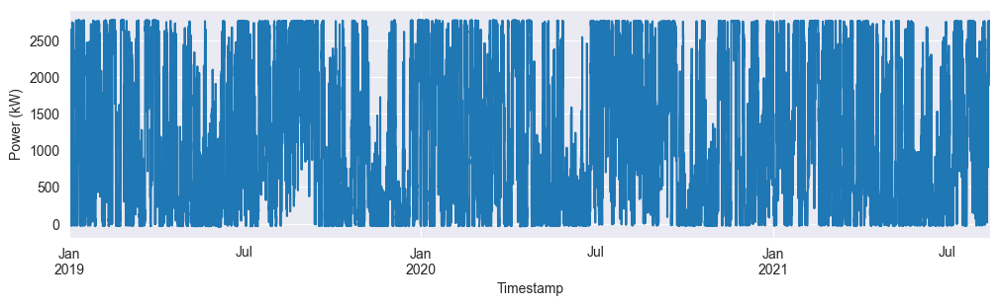

In [ ]:
# Resample hourly average power and plot
dataset.resample('H').mean()["Power(kW)"].plot(figsize=(12,3), ylabel='Power (kW)')

<Axes: title={'center': 'Average of Power(kW) of each Hours'}, xlabel='Timestamp'>

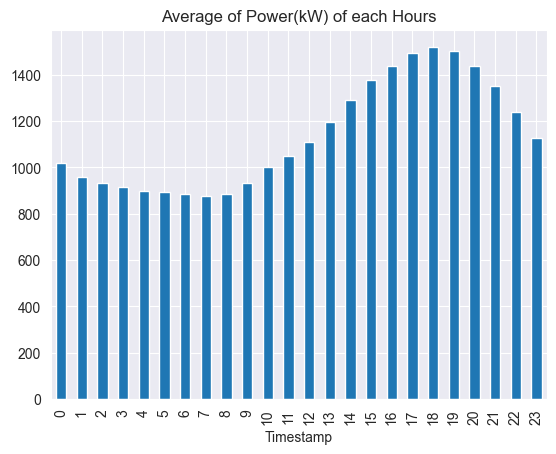

In [ ]:
dataset.groupby(dataset.index.hour).mean()["Power(kW)"].plot(kind='bar', title='Average of Power(kW) of each Hours')

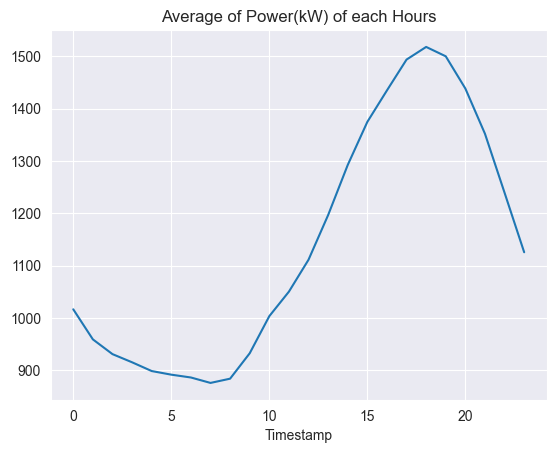

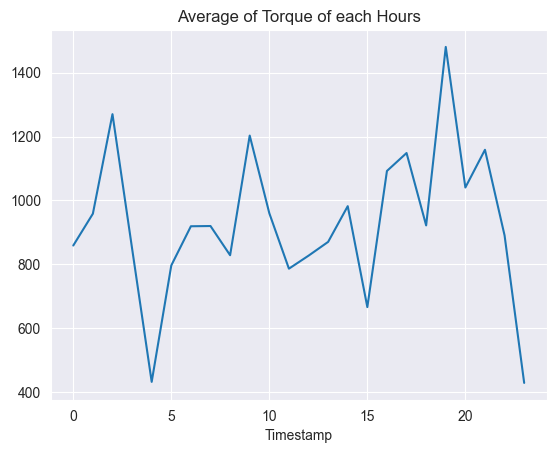

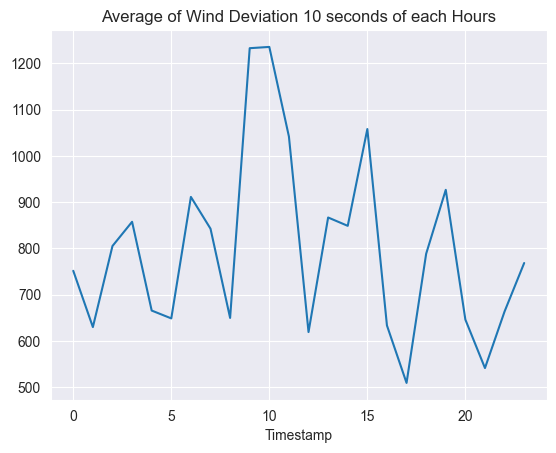

In [ ]:
dataset.groupby(dataset.index.hour).mean()["Power(kW)"].plot(title='Average of Power(kW) of each Hours')
plt.show()

dataset.groupby(dataset.index.hour).mean()["Torque"].plot(title='Average of Torque of each Hours')
plt.show()

dataset.groupby(dataset.index.hour).mean()["Wind Deviation 10 seconds"].plot(title='Average of Wind Deviation 10 seconds of each Hours')
plt.show()

# Dataset Analysis (Weekly)

<Axes: xlabel='Timestamp', ylabel='Power (kW)'>

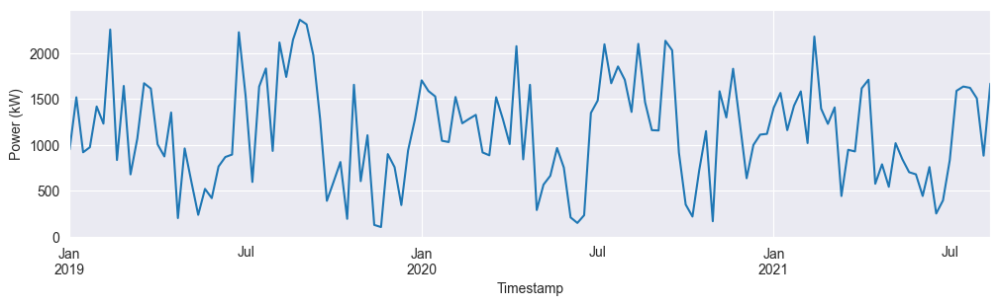

In [ ]:
# Resample hourly average power and plot
dataset.resample('W').mean()["Power(kW)"].plot(figsize=(12,3), ylabel='Power (kW)')

# Weekly Trend Across Years

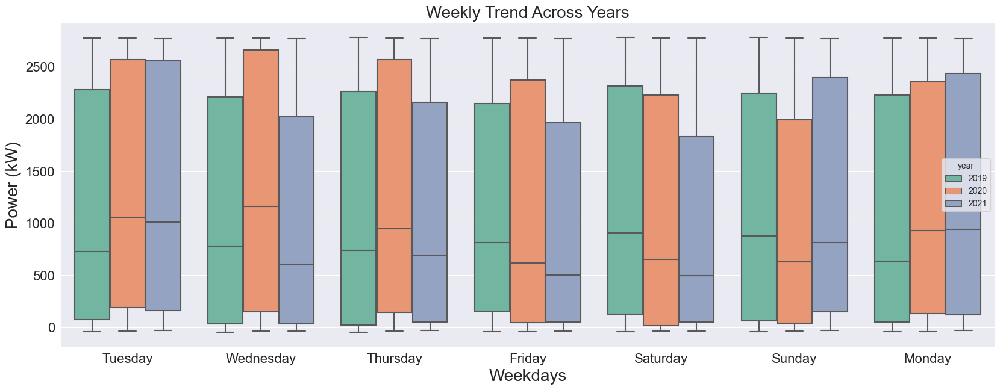

In [ ]:
fig,axes = plt.subplots(1,1,figsize=(20,7))
dataset['weekday'] = dataset.index.day_name()
dataset['month'] = dataset.index.month_name()
dataset['year'] = dataset.index.year.astype('string')
dataset['hour'] = dataset.index.strftime('%H').astype('string')

sns.boxplot(data = dataset,x="weekday",y=dataset["Power(kW)"],hue="year",palette='Set2',ax=axes)
plt.xticks(fontsize=16,rotation = "horizontal")
plt.yticks(fontsize=16,rotation = "horizontal")
plt.xlabel("Weekdays",fontsize=20)
plt.ylabel("Power (kW)",fontsize=20)
plt.title('Weekly Trend Across Years',fontsize=20)
plt.show()


# Dataset Analysis (Monthly)

<Axes: xlabel='Timestamp', ylabel='Power (kW)'>

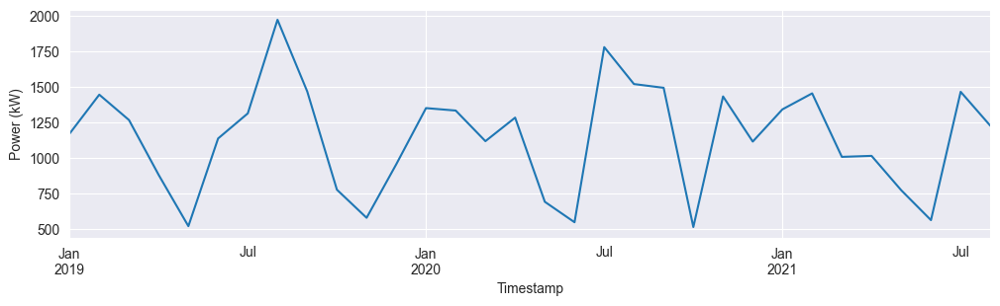

In [ ]:
# Resample hourly average power and plot
dataset["Power(kW)"].resample('M').mean().plot(figsize=(12,3), ylabel='Power (kW)')

# Yearly Average Power Generation

Text(0.5, 1.0, 'Yearly Average Power Generation')

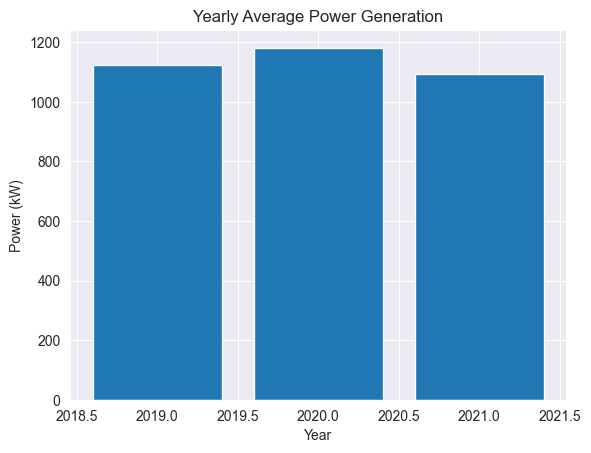

In [ ]:
plt.bar(dataset["Power(kW)"].resample('Y').mean().index.year, dataset["Power(kW)"].resample('Y').mean())
plt.xlabel('Year')
plt.ylabel('Power (kW)')
plt.title('Yearly Average Power Generation')

# Dataset Analysis (Detailed)

**Seasonal Decompisition**

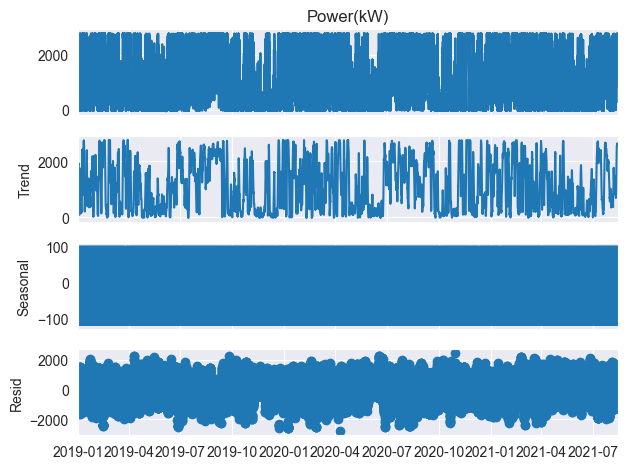

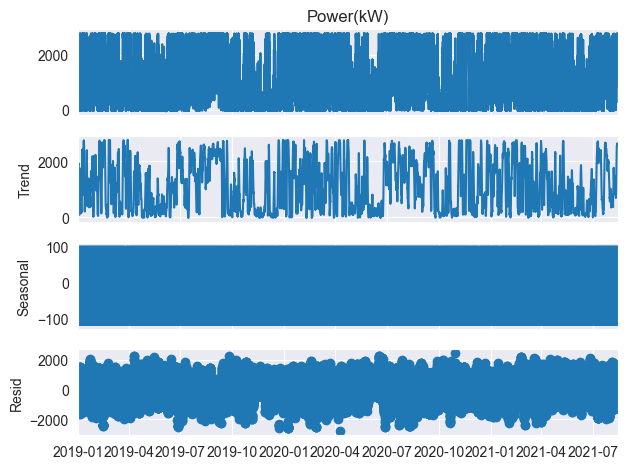

In [ ]:
seasonal_decompose(dataset["Power(kW)"], model='additive',period=24*6).plot()

**Augmented Dickey-Fuller Test**

In [ ]:
result = adfuller(dataset["Power(kW)"])
print('ADF Statistic: %f' % result[0])

ADF Statistic: -20.243008


**Stationarity Test with ADF**

In [ ]:
# ADF Test
def adf_test(dataset):
    dftest = adfuller(dataset, autolag='AIC')
    print("1. ADF : ",dftest[0])
    print("2. P-Value : ", dftest[1])
    print("3. Num Of Lags : ", dftest[2])
    print("4. Num Of Observations Used For ADF Regression:",      dftest[3])
    print("5. Critical Values :")
    if dftest[1] <= 0.05:
        print("\t The data is stationary")
    else:
        print("\t The data is non-stationary ")
    for key, val in dftest[4].items():
        print("\t",key, ": ", val)

In [ ]:
adf_test(dataset["Power(kW)"])

1. ADF :  -20.243008009091824
2. P-Value :  0.0
3. Num Of Lags :  73
4. Num Of Observations Used For ADF Regression: 136656
5. Critical Values :
	 The data is stationary
	 1% :  -3.430397853170283
	 5% :  -2.8615611504140697
	 10% :  -2.566781257614413


**PACF and ACF Plots**

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

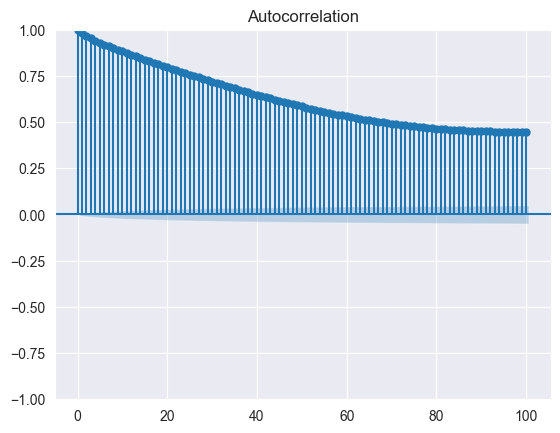

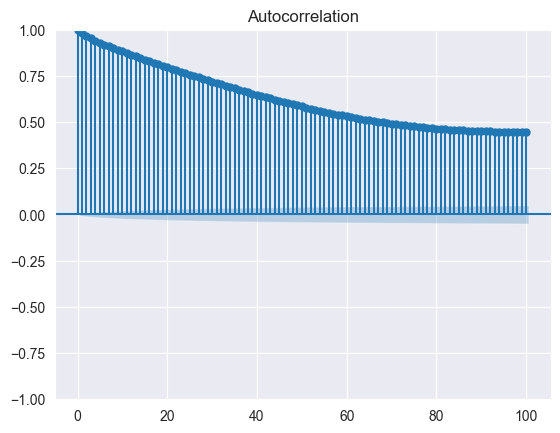

In [ ]:
plot_acf(dataset["Power(kW)"], lags=100)

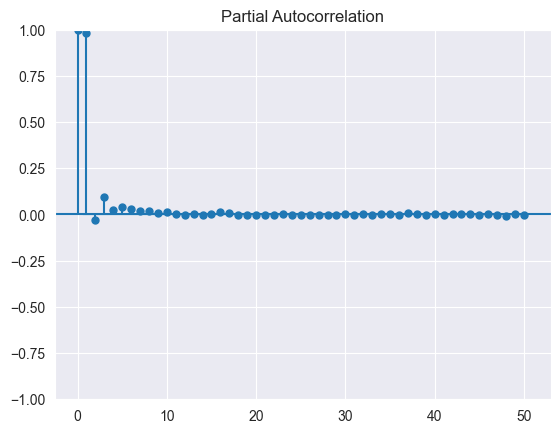

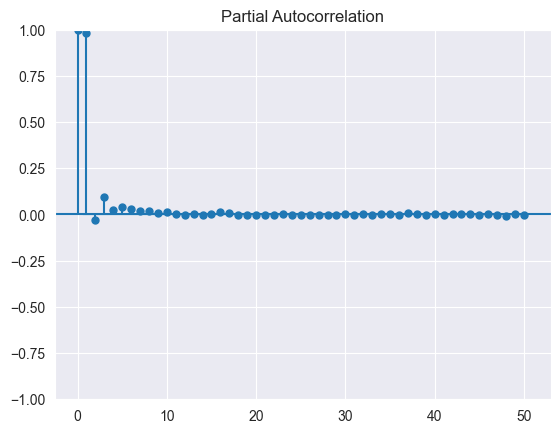

In [ ]:
plot_pacf(dataset["Power(kW)"], lags=50)

In [ ]:
# Give Most important lags
from statsmodels.tsa.stattools import acf, pacf
nlags = 50
lag_acf = acf(dataset["Power(kW)"], nlags=nlags)
lag_pacf = pacf(dataset["Power(kW)"], nlags=nlags, method='ols')

significant_acf_lags = np.where((lag_acf > 1.96/np.sqrt(len(dataset["Power(kW)"]))) | 
                                (lag_acf < -1.96/np.sqrt(len(dataset["Power(kW)"]))))[0]
significant_pacf_lags = np.where((lag_pacf > 1.96/np.sqrt(len(dataset["Power(kW)"]))) | 
                                 (lag_pacf < -1.96/np.sqrt(len(dataset["Power(kW)"]))))[0]

print('Significant ACF lags:', significant_acf_lags)
print('Significant PACF lags:', significant_pacf_lags)

Significant ACF lags: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50]
Significant PACF lags: [ 0  1  2  3  4  5  6  7  8  9 10 16 17 37 48]


**Rolling statistics**

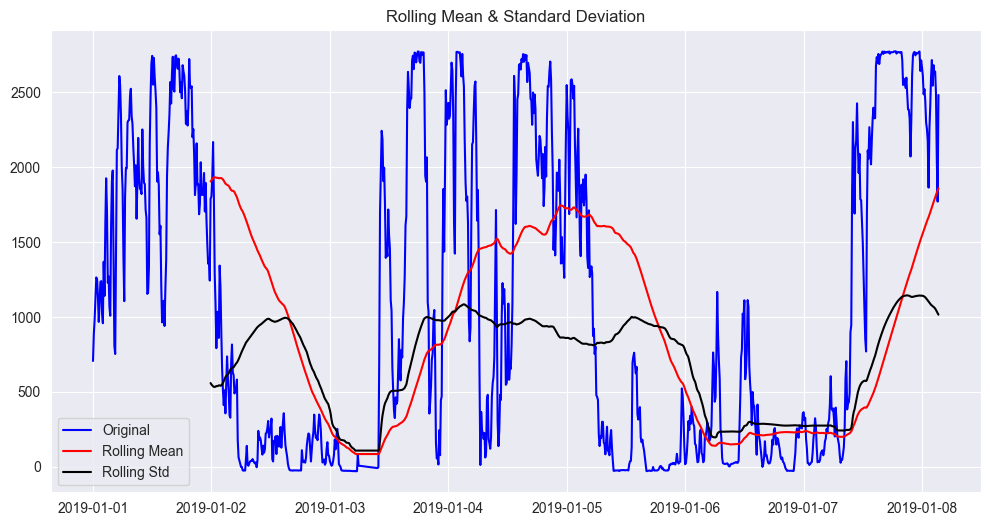

In [ ]:
def rolling_statistics(dataset):
    #Determing rolling statistics
    rolmean = dataset.rolling(window=24*6).mean()
    rolstd = dataset.rolling(window=24*6).std()

    #Plot rolling statistics:
    plt.figure(figsize=(12, 6))
    orig = plt.plot(dataset, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
rolling_statistics(dataset["Power(kW)"][0:24*6*7])

# Correlation Matrix

In [ ]:
dataset.drop(['weekday', 'month', 'year', 'hour'], axis=1, inplace=True)

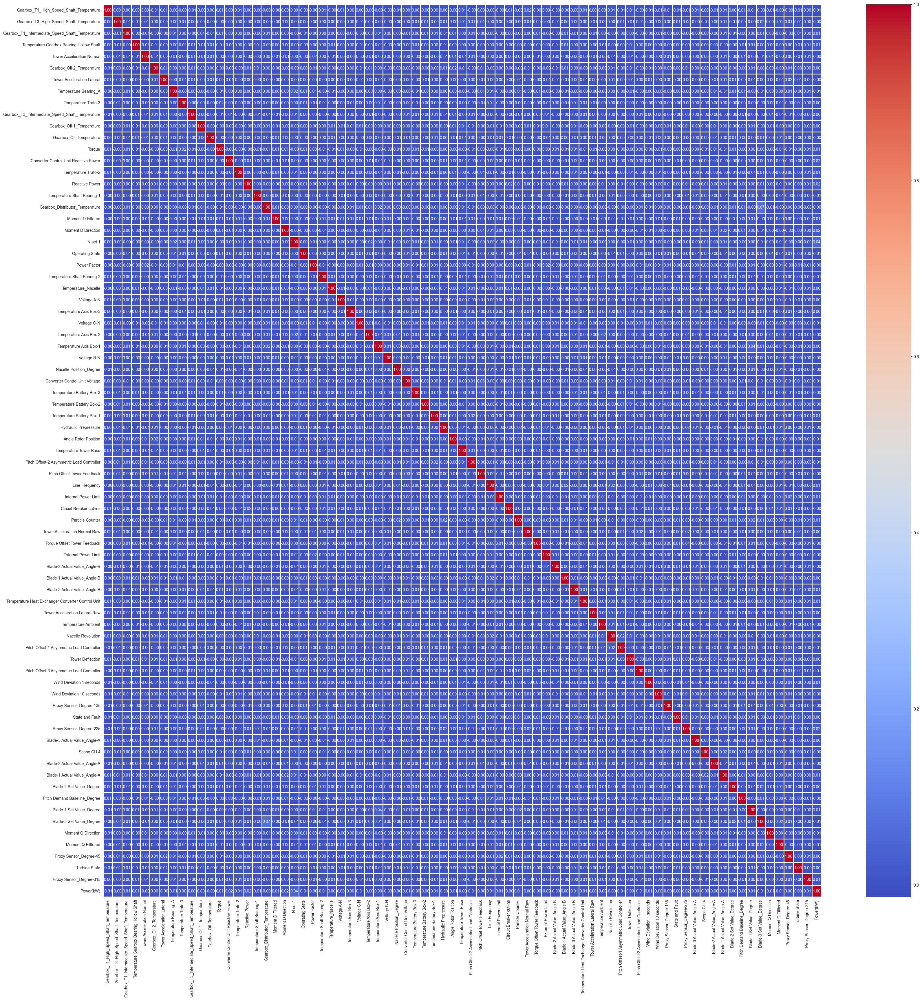

In [ ]:
corr = dataset.corr()
plt.figure(figsize=(40, 40))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=2)
plt.show()

In [ ]:
corr['Power(kW)'].sort_values(ascending=False)[:10]

Power(kW)                                   1.000000
N-set 1                                     0.041943
Converter Control Unit Reactive Power       0.019078
Proxy Sensor_Degree-225                     0.018555
Reactive Power                              0.017958
Moment D Direction                          0.016203
Blade-3 Actual Value_Angle-B                0.012471
Temperature Gearbox Bearing Hollow Shaft    0.010372
Wind Deviation 1 seconds                    0.009977
Proxy Sensor_Degree-315                     0.009855
Name: Power(kW), dtype: float64

In [ ]:
import warnings
warnings.filterwarnings("ignore")
dataset["sin_hour_of_day"]  = np.sin(2*np.pi*dataset.index.hour/24)
dataset["cos_hour_of_day"]  = np.cos(2*np.pi*dataset.index.hour/24)
dataset["sin_day_of_week"]  = np.sin(2*np.pi*dataset.index.dayofweek/7)
dataset["cos_day_of_week"]  = np.cos(2*np.pi*dataset.index.dayofweek/7)
dataset["sin_day_of_month"] = np.sin(2*np.pi*dataset.index.day/30)
dataset["cos_day_of_month"] = np.cos(2*np.pi*dataset.index.day/30)
dataset["sin_month_of_year"]= np.sin(2*np.pi*dataset.index.month/12)
dataset["cos_month_of_year"]= np.cos(2*np.pi*dataset.index.month/12)
dataset["sin_day_of_year"]  = np.sin(2*np.pi*dataset.index.dayofyear/365)
dataset["cos_day_of_year"]  = np.cos(2*np.pi*dataset.index.dayofyear/365)

y = dataset["Power(kW)"]
for i in range(1, 10):
    dataset[f"lag_{i}_Power"] = dataset["Power(kW)"].shift(i)
    dataset[f"lag_{i}_N-set 1"] = dataset["Power(kW)"].shift(i)

for i in [6, 3*6, 6*6, 24*6]:
    dataset[f"rolling_mean_{i}_Power"] = dataset["Power(kW)"].rolling(i).mean()
    dataset[f"rolling_std_{i}_Power"] = dataset["Power(kW)"].rolling(i).std()
    dataset[f"rolling_mean_{i}_N-set 1"] = dataset["Power(kW)"].rolling(i).mean()
    dataset[f"rolling_std_{i}_N-set 1"] = dataset["Power(kW)"].rolling(i).std()
    for j in range(1, 10):
        dataset[f"lag_{j}_rolling_mean_{i}_Power"] = dataset[f"rolling_mean_{i}_Power"].shift(i)
        dataset[f"lag_{j}_rolling_std_{i}_Power"] = dataset[f"rolling_std_{i}_Power"].shift(i)
        dataset[f"lag_{j}_rolling_mean_{i}_N-set 1"] = dataset[f"rolling_mean_{i}_N-set 1"].shift(i)
        dataset[f"lag_{j}_rolling_std_{i}_N-set 1"] = dataset[f"rolling_std_{i}_N-set 1"].shift(i)

dataset.dropna(inplace=True)
dataset.drop(['Power(kW)'], axis=1, inplace=True)
dataset["Power(kW)"] = y

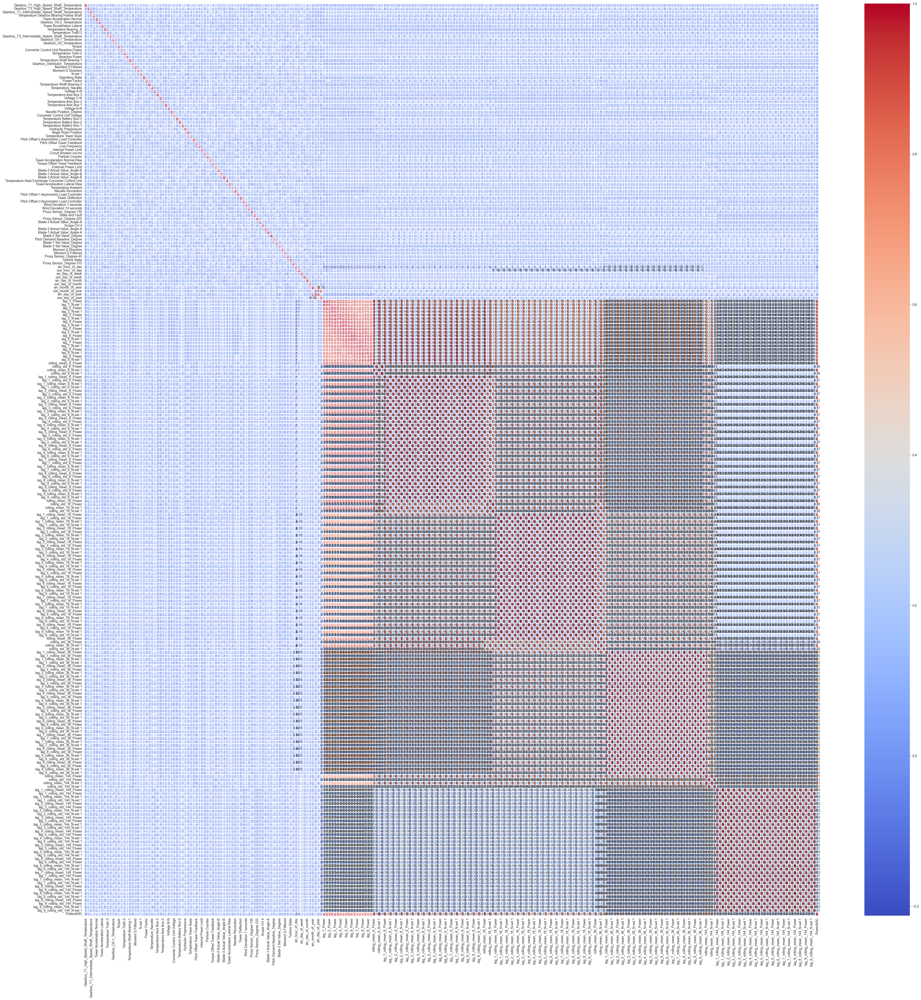

In [ ]:
corr = dataset.corr()
plt.figure(figsize=(50, 50))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=2)
plt.show()

In [ ]:
corr['Power(kW)'].sort_values(ascending=False)[:20]

Power(kW)                       1.000000
lag_1_Power                     0.983922
lag_1_N-set 1                   0.983922
rolling_mean_6_Power            0.977372
rolling_mean_6_N-set 1          0.977372
lag_2_Power                     0.967132
lag_2_N-set 1                   0.967132
lag_3_Power                     0.953579
lag_3_N-set 1                   0.953579
lag_4_Power                     0.941211
lag_4_N-set 1                   0.941211
rolling_mean_18_Power           0.936258
rolling_mean_18_N-set 1         0.936258
lag_5_Power                     0.929964
lag_5_N-set 1                   0.929964
lag_6_Power                     0.919632
lag_6_N-set 1                   0.919632
lag_1_rolling_mean_6_N-set 1    0.909818
lag_1_rolling_mean_6_Power      0.909818
lag_2_rolling_mean_6_Power      0.909818
Name: Power(kW), dtype: float64

**Now we have lots of useful correlations, we can forecast up to 1 hour.**

In [ ]:
len(dataset.columns)

265